## Collaborative based recommendation system 

In [1]:
# Import necessary library 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
sns.set_style('white')
%matplotlib inline 
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors
import pickle

In [2]:
#Loading necessary data
df1 = pd.read_csv('movies.csv',usecols  = ['movieId','title'],dtype = {'movieId':'int32','title':'string'})
df2 = pd.read_csv('ratings.csv',usecols = ['userId','movieId','rating'],dtype = {'usedId':'int32','movieTd':'int32','rating':'float32'})

In [3]:
df1.head()

,movieId,title
0,1,Toy Story (1995)
1,2,Jumanji (1995)
2,3,Grumpier Old Men (1995)
3,4,Waiting to Exhale (1995)
4,5,Father of the Bride Part II (1995)


In [4]:
df2.head()

,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0


In [5]:
# All the 'title' have the date appended at the end which needs to be removed 
df1['title'] = df1['title'].str[:-7]
# Converting the 'title' to lowercase for search complexity
df1['title'] = df1['title'].str.lower()

In [6]:
df1.head()

,movieId,title
0,1,toy story
1,2,jumanji
2,3,grumpier old men
3,4,waiting to exhale
4,5,father of the bride part ii


In [7]:
# Merging df1 and df2 on movieId
df3 = pd.merge(df2,df1,on = 'movieId')
df3.head()

,userId,movieId,rating,title
0,1,1,4.0,toy story
1,5,1,4.0,toy story
2,7,1,4.5,toy story
3,15,1,2.5,toy story
4,17,1,4.5,toy story


In [8]:
df4 = df3.dropna(axis = 0,subset = ['title'])
df5 = (df4.
       groupby(by = ['title'])['rating'].
       count().
       reset_index().
       rename(columns = {'rating':'Rating_Count'})
       [['title','Rating_Count']]
        ) 

In [9]:
df6 = pd.merge(df3,df5,on = 'title')


In [10]:
df6.head()

,userId,movieId,rating,title,Rating_Count
0,1,1,4.0,toy story,215
1,5,1,4.0,toy story,215
2,7,1,4.5,toy story,215
3,15,1,2.5,toy story,215
4,17,1,4.5,toy story,215


In [11]:
pd.set_option('display.float_format',lambda x:'%.3f'% x)
print(df6['Rating_Count'].describe())

count   100836.000
mean        59.428
std         61.955
min          1.000
25%         14.000
50%         39.000
75%         85.000
max        329.000
Name: Rating_Count, dtype: float64


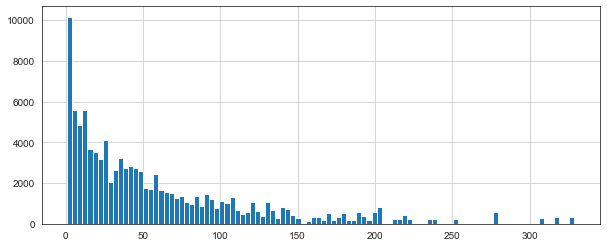

In [12]:
# Now a few histograms 
plt.figure(figsize = (10,4))
df6['Rating_Count'].hist(bins = 100)

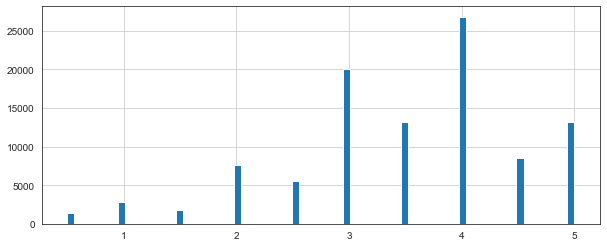

In [15]:
plt.figure(figsize=(10,4))
df6['rating'].hist(bins=70)

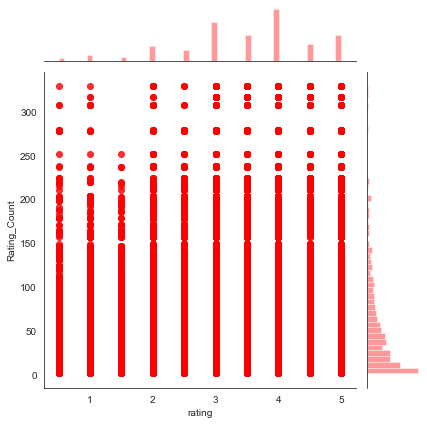

In [16]:
sns.jointplot(x  = 'rating',y = 'Rating_Count', data = df6, kind = 'scatter',color = 'r', alpha = 0.8) 

### Working on recommendation model
#### From the histogram of 'Rating_Count', it looks like Rating_Count less than 50 won't contribute more in building our recommendation system


In [13]:
popularity_threshold = 50
df7 = df6.query('Rating_Count >= @popularity_threshold')

In [14]:
#df7.to_csv('data.csv',index=False)

In [14]:
# First lets create a Pivot matrix
df8 = df7.pivot_table(index = 'title', columns = 'userId',values = 'rating').fillna(0)
df8.head()

userId,1,2,3,4,5,6,7,8,9,10,...,601,602,603,604,605,606,607,608,609,610
title,,,,,,,,,,,,,,,,,,,,,
10 things i hate about you,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,3.000,0.000,5.000,0.000,0.000,0.000,0.000,0.000
12 angry men,0.000,0.000,0.000,5.000,0.000,0.000,0.000,0.000,0.000,0.000,...,5.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2001: a space odyssey,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,0.000,...,0.000,0.000,5.000,0.000,0.000,5.000,0.000,3.000,0.000,4.500
28 days later,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.500,0.000,5.000
300,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,...,0.000,0.000,0.000,0.000,3.000,0.000,0.000,5.000,0.000,4.000


In [15]:
feature_matrix = csr_matrix(df8.values)
model = NearestNeighbors(metric='cosine',algorithm='brute').fit(feature_matrix) 
model

NearestNeighbors(algorithm='brute', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)